In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pickle
import copy

# Figure S5a: Selected compounds broken down by team, target, and selection method

In [2]:
# load submission df
df = pd.read_csv('../../merged_submission_lists/df_complete.csv')
print(df.shape)
df.head()

(562474, 16)


/home/johannes/anaconda3/envs/covid19_analysis/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (5,14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,smiles,owner_info,team,target_subm,list_pos,target_selected,from_gtm,from_medoids,from_topranked,in_selected,in_selected_minusDB,plannedToSynth,synthesized,hit,target_hit,further-submission-info
0,Oc1ccc2c(NC(=O)C3Cc4ccccc4C3)n[nH]c2c1,N_mlinch.csv-POS22+S_mlinch.csv-POS1335+nsp12_...,imolecule,n,22,n,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
1,Oc1ccc2c(NC(=O)C3Cc4ccccc4C3)n[nH]c2c1,N_mlinch.csv-POS22+S_mlinch.csv-POS1335+nsp12_...,imolecule,s,1335,n,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
2,Oc1ccc2c(NC(=O)C3Cc4ccccc4C3)n[nH]c2c1,N_mlinch.csv-POS22+S_mlinch.csv-POS1335+nsp12_...,imolecule,nsp12,1256,n,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
3,Oc1ccc2c(NC(=O)C3Cc4ccccc4C3)n[nH]c2c1,N_mlinch.csv-POS22+S_mlinch.csv-POS1335+nsp12_...,imolecule,nsp3,1832,n,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
4,Oc1ccc2c(NC(=O)C3Cc4ccccc4C3)n[nH]c2c1,N_mlinch.csv-POS22+S_mlinch.csv-POS1335+nsp12_...,imolecule,nsp5,6196,n,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN


In [3]:
# Targets
df.target_subm.unique()

array(['n', 's', 'nsp12', 'nsp3', 'nsp5', 'tmprss2', 'furin', 'nsp1',
       'aak1', 'nsp10-16'], dtype=object)

In [4]:
# Teams
team_loop = list(df.team.unique())
team_loop.sort()

In [5]:
# some compounds were suggested multiple times by the same team. We just keep the dataframe
# row with the lowest list position
df = df.sort_values('list_pos').drop_duplicates(subset=['smiles', 'team', 'target_subm', 'from_gtm', 'from_medoids', 'from_topranked'], keep='first')
print(df.shape)
df

(479110, 16)


,smiles,owner_info,team,target_subm,list_pos,target_selected,from_gtm,from_medoids,from_topranked,in_selected,in_selected_minusDB,plannedToSynth,synthesized,hit,target_hit,further-submission-info
331439,Cc1cc(no1)C(=O)NC1=CC=CN(C(Cc2ccc(F)cc2)C(=O)N...,nsp5_sarstroopers.csv-POS1+nsp5_sarstroopers.c...,sarstroopers,nsp5,1,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
11188,NC(=O)CN1C(CN2CC(Oc3ccccc23)C(=O)N2CCCCC2)=Nc2...,nsp12_covid19ddc.csv-POS1,covid19ddc,nsp12,1,nsp12,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
77462,NC(CSC1CC(ON1)C(N)C(O)=O)C(O)=O,S_mlinch.csv-POS1+S_mlinch.csv-POS5627+nsp3_ml...,imolecule,s,1,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
7834,NC(=O)c1ncn(n1)C1OC(COP(O)(=O)OC2C(O)C(CO)OC2n...,nps5_nuwave.csv-POS8+nsp10-16_nuwave.csv-POS1,nuwave,nsp10-16,1,nsp5,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
115902,NC1=NC(=O)N(C=C1)C1OC(CO)C(O)C1(F)F,ace2_pharmai.csv-POS5215+ace2_pharmai.csv-POS6...,cermn,nsp3,1,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98729,CCCCCCCCCCCCCCN1C(=O)N(C)c2nc3CC(C)C4(Oc5c(C4=...,S_sarstroopers.csv-POS11897,sarstroopers,s,11897,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
98730,CCCCCCCCCC=CC=CC=CC=CC=CC=CC(=O)OC(CO)COP(O)(=...,S_sarstroopers.csv-POS11898,sarstroopers,s,11898,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
98731,CCCCCCCCCC=CC=CC=CC=CC=CC=CC(=O)OCC(CO)OP(O)(=...,S_sarstroopers.csv-POS11899,sarstroopers,s,11899,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
98732,CCCCCCCCCCCCCCCCCC(=O)Oc1ccc2C3CCC4(C)C(O)CCC4...,S_sarstroopers.csv-POS11900,sarstroopers,s,11900,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN


In [6]:
df_selected = df[(df.in_selected == 1) & (df.target_selected == df.target_subm)] # only consider compounds with matching targets
print(df_selected.shape)

(11646, 16)


In [7]:
target_loop = ['n', 's', 'nsp3', 'nsp5', 'nsp12', 'tmprss2']

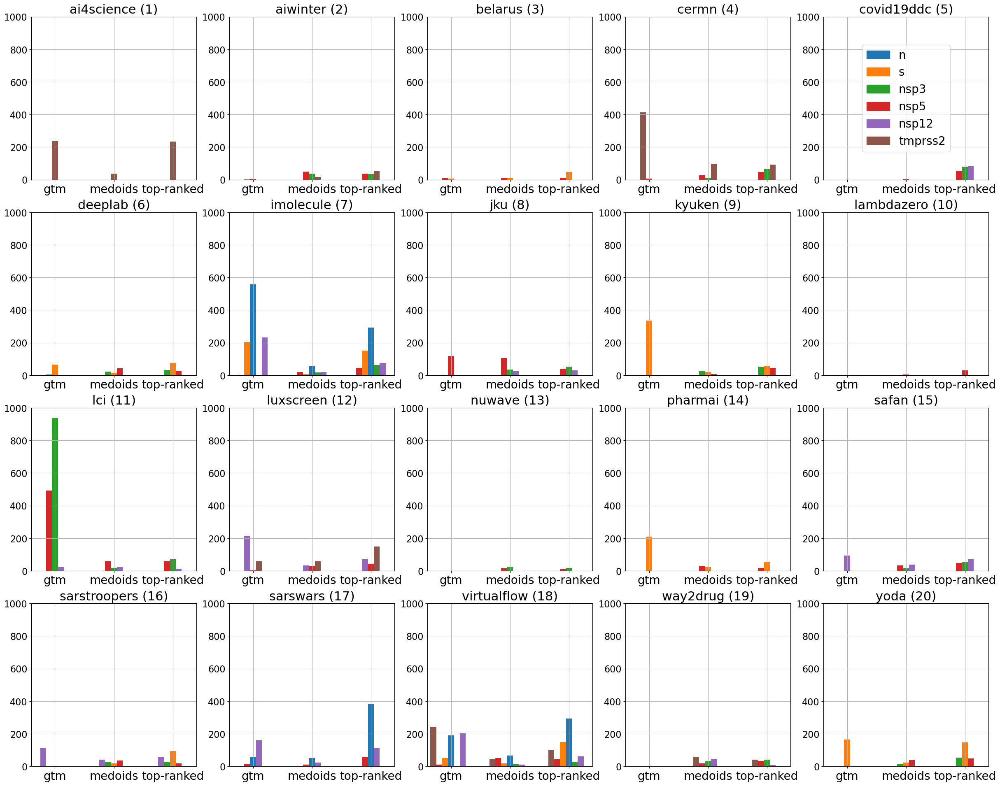

In [8]:
plt.figure(figsize=(5*6, 6*6))
width = 0.1
x_names = ['gtm', 'medoids', 'top-ranked']
x = np.arange(3)

for counter, team in enumerate(team_loop):
    plt.subplot(6,5,counter+1)
    
    x_adjusts_gtm = [0,-0.1,0.1,-0.2,0.2,-0.3,0.3]
    x_adjusts_med = [0,-0.1,0.1,-0.2,0.2,-0.3,0.3]
    x_adjusts_top = [0,-0.1,0.1,-0.2,0.2,-0.3,0.3]
    
    for counter_2, target in enumerate(target_loop):
        df_temp = df_selected[(df_selected.team == team) & (df_selected.target_selected == target)]

        counts_gtm = df_temp.from_gtm.sum()
        counts_med = df_temp.from_medoids.sum()
        counts_topRanked = df_temp.from_topranked.sum()
        
        x_adjusted = list()
        if counts_gtm != 0:
            x_adjusted.append(x_adjusts_gtm[0])
            x_adjusts_gtm.pop(0)
        else:
            x_adjusted.append(np.nan)
        if counts_med != 0:
            x_adjusted.append(x_adjusts_med[0])
            x_adjusts_med.pop(0)
        else:
            x_adjusted.append(np.nan)
        if counts_topRanked != 0:
            x_adjusted.append(x_adjusts_top[0])
            x_adjusts_top.pop(0)
        else:
            x_adjusted.append(np.nan)
        x_adjusted = np.array(x_adjusted)
        x_adjusted = x + x_adjusted
        y_bar = np.array([counts_gtm, counts_med, counts_topRanked])

        y_bar = y_bar[~np.isnan(x_adjusted)]
        x_adjusted = x_adjusted[~np.isnan(x_adjusted)]

        plt.bar(x_adjusted, y_bar, width, label=target)
    plt.xticks(x, x_names, fontsize=20)
    plt.yticks(fontsize=16)
    plt.xlim(-0.4,2.4)
    plt.ylim(0,1000)
    plt.title(f'{team} ({counter+1})', fontsize=22)
    plt.grid()
    
plt.subplot(6,5,5)

handles = list()
colors = ('tab:blue', 'tab:orange', 'tab:green', 'tab:red',
          'tab:purple', 'tab:brown')
for l, c in zip(target_loop, colors):
    patch = mpatches.Patch(color=c, label=l)
    handles.append(patch)

plt.legend(handles=handles, loc='center', fontsize=20)

plt.savefig('figures/figure_s5a.png')
plt.savefig('figures/figure_s5a.svg')
    
plt.show()

# Figure S5b: Synthesized compounds broken down by team, target, and selection method

In [9]:
df_syn = df[(df.synthesized == 1) & (df.target_selected == df.target_subm)] # only consider compounds with matching targets

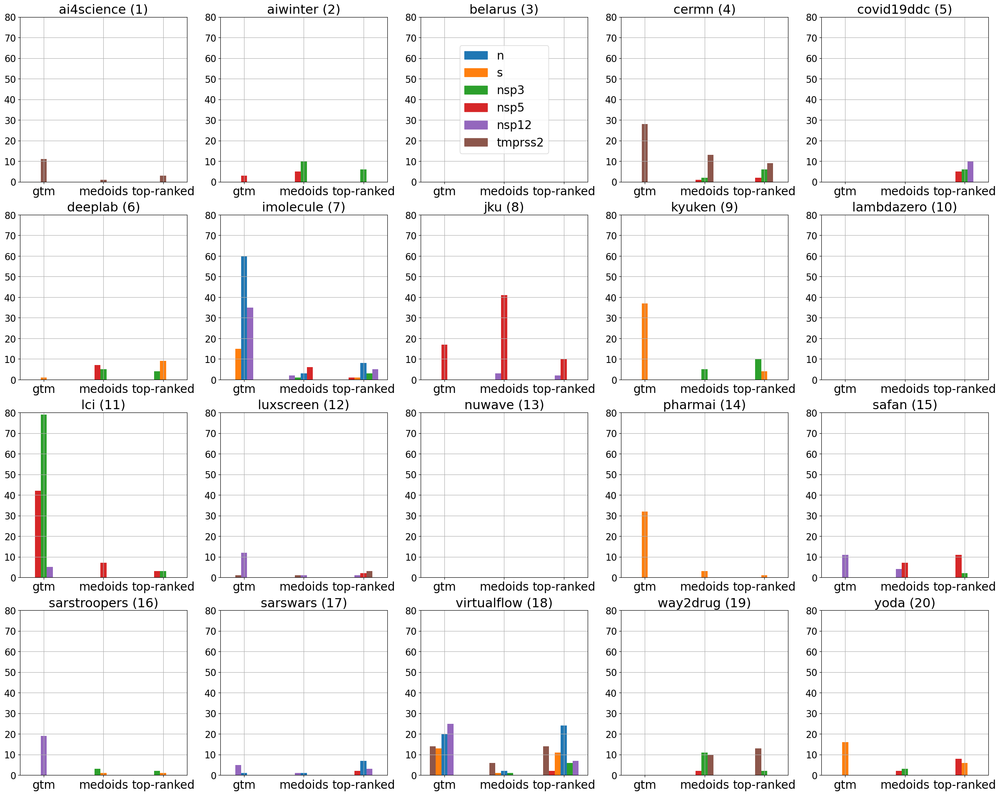

In [10]:
plt.figure(figsize=(5*6, 6*6))
width = 0.1
x_names = ['gtm', 'medoids', 'top-ranked']
x = np.arange(3)

for counter, team in enumerate(team_loop):
    plt.subplot(6,5,counter+1)
    
    x_adjusts_gtm = [0,-0.1,0.1,-0.2,0.2,-0.3,0.3]
    x_adjusts_med = [0,-0.1,0.1,-0.2,0.2,-0.3,0.3]
    x_adjusts_top = [0,-0.1,0.1,-0.2,0.2,-0.3,0.3]
    
    for counter_2, target in enumerate(target_loop):
        df_temp = df_syn[(df_syn.team == team) & (df_syn.target_selected == target)]

        counts_gtm = df_temp.from_gtm.sum()
        counts_med = df_temp.from_medoids.sum()
        counts_topRanked = df_temp.from_topranked.sum()
        
        x_adjusted = list()
        if counts_gtm != 0:
            x_adjusted.append(x_adjusts_gtm[0])
            x_adjusts_gtm.pop(0)
        else:
            x_adjusted.append(np.nan)
        if counts_med != 0:
            x_adjusted.append(x_adjusts_med[0])
            x_adjusts_med.pop(0)
        else:
            x_adjusted.append(np.nan)
        if counts_topRanked != 0:
            x_adjusted.append(x_adjusts_top[0])
            x_adjusts_top.pop(0)
        else:
            x_adjusted.append(np.nan)
        x_adjusted = np.array(x_adjusted)
        x_adjusted = x + x_adjusted
        y_bar = np.array([counts_gtm, counts_med, counts_topRanked])

        y_bar = y_bar[~np.isnan(x_adjusted)]
        x_adjusted = x_adjusted[~np.isnan(x_adjusted)]

        plt.bar(x_adjusted, y_bar, width, label=target)
    plt.xticks(x, x_names, fontsize=20)
    plt.yticks(fontsize=16)
    plt.xlim(-0.4,2.4)
    plt.ylim(0,80)
    plt.title(f'{team} ({counter+1})', fontsize=22)
    plt.grid()
    
plt.subplot(6,5,3)

handles = list()
colors = ('tab:blue', 'tab:orange', 'tab:green', 'tab:red',
          'tab:purple', 'tab:brown')
for l, c in zip(target_loop, colors):
    patch = mpatches.Patch(color=c, label=l)
    handles.append(patch)

plt.legend(handles=handles, loc='center', fontsize=20)

plt.savefig('figure_s5b.png')
plt.savefig('figure_s5b.svg')
    
plt.show()

# Figure S6: Histograms of selected compounds (blue) and synthesized compounds (orange) as a function of the ranking of each individual team

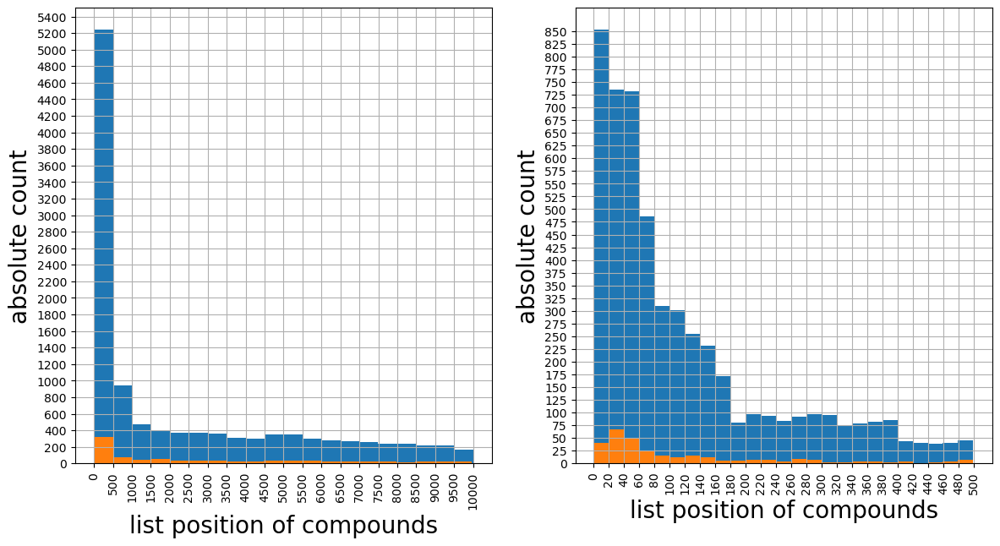

In [11]:
plt.figure(figsize=(14,7))

plt.subplot(1,2,1)
plt.hist(df_selected.list_pos.values, bins=20)
plt.hist(df_syn.list_pos.values, bins=20)
plt.grid()
plt.xticks(np.arange(0,10500,500), rotation='vertical')
plt.yticks(np.arange(0,5600,200))
plt.xlabel('list position of compounds', fontsize=20)
plt.ylabel('absolute count', fontsize=20)

plt.subplot(1,2,2)
plt.hist(df_selected.list_pos.values[df_selected.list_pos.values<500], bins=25)
plt.hist(df_syn.list_pos.values[df_syn.list_pos.values<500], bins=25)
plt.grid()
plt.xticks(np.arange(0,520,20), rotation='vertical')
plt.yticks(np.arange(0,875,25))
plt.xlabel('list position of compounds', fontsize=20)
plt.ylabel('absolute count', fontsize=20)

plt.savefig('figures/figure_s6.png')
plt.savefig('figures/figure_s6.svg')

plt.show()

# Figure S7: Ratio synthesized compounds list versus selected compounds list 

/home/johannes/anaconda3/envs/covid19_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in double_scalars
/home/johannes/anaconda3/envs/covid19_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in double_scalars
/home/johannes/anaconda3/envs/covid19_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in double_scalars


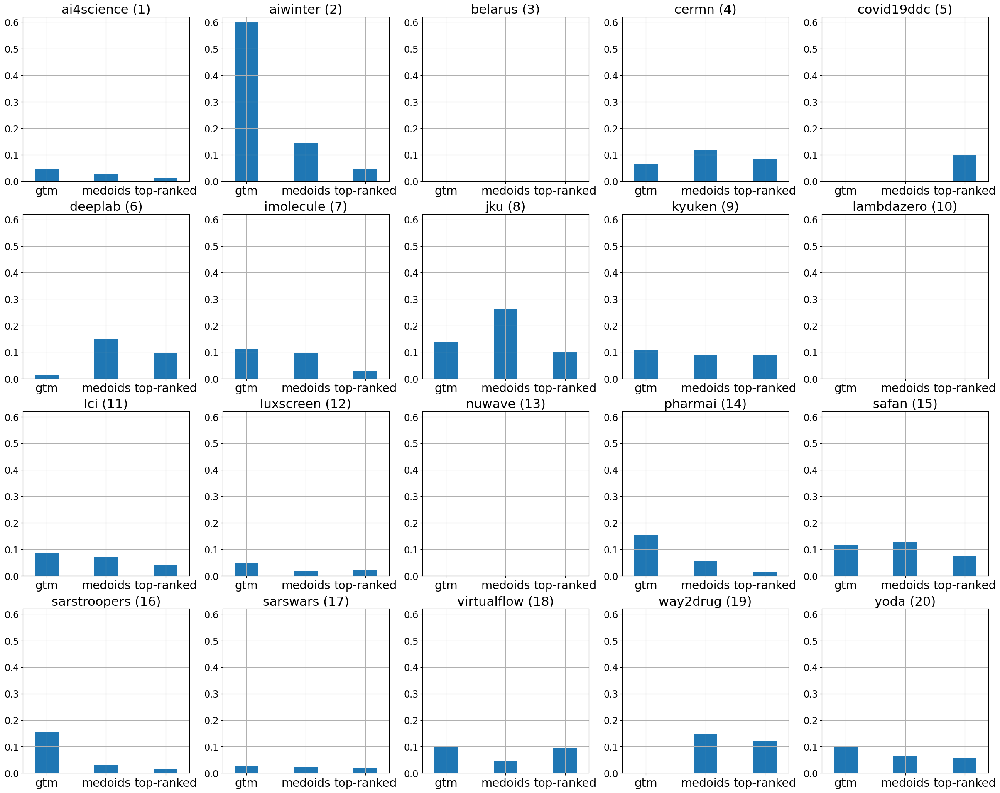

In [12]:
plt.figure(figsize=(5*6, 6*6), frameon = False)

for counter, team in enumerate(team_loop):
    plt.subplot(6,5,counter+1)
    
    df_temp = df_selected[df_selected.team == team]
    
    counts_gtm_selected = df_temp.from_gtm.sum()
    counts_med_selected = df_temp.from_medoids.sum()
    counts_topRanked_selected = df_temp.from_topranked.sum()
    
    df_temp = df_syn[df_syn.team == team]
    
    counts_gtm = df_temp.from_gtm.sum()
    counts_med = df_temp.from_medoids.sum()
    counts_topRanked = df_temp.from_topranked.sum()
    
    counts_gtm = counts_gtm / counts_gtm_selected
    counts_med = counts_med / counts_med_selected
    counts_topRanked = counts_topRanked / counts_topRanked_selected
    
    plt.bar(['gtm', 'medoids', 'top-ranked'], [counts_gtm, counts_med, counts_topRanked], width=0.4)
    plt.title(f'{team} ({counter+1})', fontsize=22)
    plt.xticks(range(3),['gtm', 'medoids', 'top-ranked'],fontsize=20)
    plt.xlim(-0.4,2.4)
    plt.yticks(fontsize=16)
    plt.ylim(0,0.62)
    plt.grid()

plt.savefig('figures/figure_s7.png')
plt.savefig('figures/figure_s7.svg')

plt.show()

# Figure S8: Overall percentages of origin by selection method
Left: selected molecules list (6 protein targets x ~2000 compounds), right: synthesized compound list (878 molecules in total over 6 targets)

In [13]:
# Counts for gtm, medoids and top ranked in synthesized list
df_syn_offtarget = df[df.synthesized == 1]

gtm_count = df_syn_offtarget[df_syn_offtarget.from_gtm == 1].smiles.unique().shape[0]
med_count = df_syn_offtarget[df_syn_offtarget.from_medoids == 1].smiles.unique().shape[0]
topranked_count = df_syn_offtarget[df_syn_offtarget.from_topranked == 1].smiles.unique().shape[0]

In [14]:
gtm_count_selected = df[(df.in_selected == 1) & (df.from_gtm == 1)].smiles.unique().shape[0]
med_count_selected = df[(df.in_selected == 1) & (df.from_medoids == 1)].smiles.unique().shape[0]
topranked_count_selected = df[(df.in_selected == 1) &(df.from_topranked == 1)].smiles.unique().shape[0]

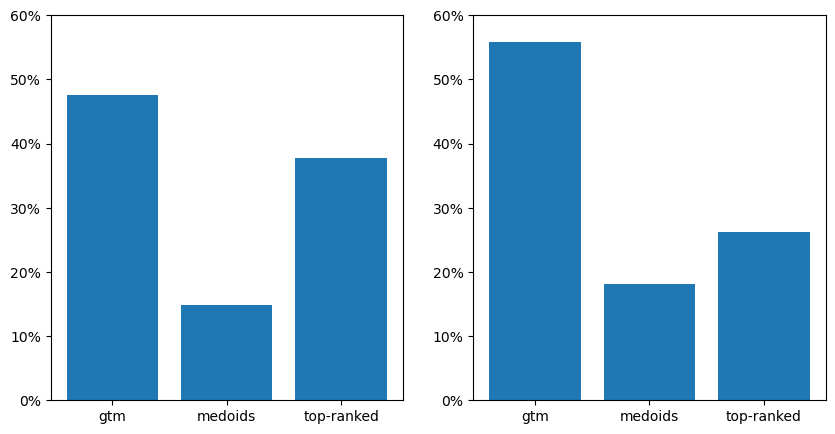

In [15]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
div = np.sum([gtm_count_selected, med_count_selected, topranked_count_selected])
plt.bar(['gtm', 'medoids', 'top-ranked'], [gtm_count_selected/div, med_count_selected/div,
                                           topranked_count_selected/div])
plt.ylim(0,0.6)
plt.yticks(np.arange(0,0.7,0.1), ['0%', '10%', '20%', '30%', '40%', '50%', '60%'])

plt.subplot(1,2,2)
div_syn = np.sum([gtm_count, med_count, topranked_count]) 
plt.bar(['gtm', 'medoids', 'top-ranked'], [gtm_count/div_syn , med_count/div_syn , topranked_count/div_syn ])
plt.yticks(np.arange(0,0.7,0.1), ['0%', '10%', '20%', '30%', '40%', '50%', '60%'])

plt.savefig('figures/figure_s8.png')
plt.savefig('figures/figure_s8.svg')

plt.show()

# Figure S9a: Nsp5 scatterplots - version 1

In [16]:
# Get teams which are connected to the hits
hits = pd.read_csv("data/hits.csv")
hits = hits[hits['Exp Target'] == 'Nsp5']
hits_nsp5_idx = hits.index.values
hits_team = list(hits['Team'])

# defining colors for hits
colors = {'jku':'tab:blue', 'jku, aiwinter':'tab:orange', 'ai4science':'tab:green',
          'cermn':'tab:red', 'covid19ddc':'tab:purple', 'deeplab':'tab:brown',
          'kyuken':'tab:pink', 'imolecule':'darkgreen', 'virtualflow':'tab:olive', 'way2drug':'tab:cyan'}

In [17]:
# load helper files to be able to match the pre-computed tsne-embeddings to the dataframe
with open('data/idx_transform_dict.pkl', 'rb') as fl:
    id_transform_dict = pickle.load(fl)
    
with open('data/dict_smiles_idForTsne.pkl', 'rb') as fl:
    smiles_id_dict = pickle.load(fl)

df = pd.read_csv('../../merged_submission_lists/df_complete.csv')
# Apply helper files
df_subm = copy.deepcopy(df)

df_subm = df_subm[['smiles', 'team', 'target_subm', 'list_pos']]
df_subm = df_subm.drop_duplicates()

df_subm['tsne_idx'] = [smiles_id_dict[smiles] for smiles in df_subm.smiles]     
df_subm_read = df_subm[df_subm.tsne_idx.isin(list(id_transform_dict.keys()))]    
df_subm_read['tsne_idx'] = [id_transform_dict[i] for i in df_subm_read.tsne_idx]

# Nsp5 filter
df_subm_nsp5 = df_subm_read[df_subm_read.target_subm == 'nsp5']

df_subm_nsp5.head()

/home/johannes/anaconda3/envs/covid19_analysis/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (5,14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/johannes/anaconda3/envs/covid19_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


,smiles,team,target_subm,list_pos,tsne_idx
4,Oc1ccc2c(NC(=O)C3Cc4ccccc4C3)n[nH]c2c1,imolecule,nsp5,6196,9120
10,Cc1ccc2oc(nc2c1)N1CCC(CC1)c1cc(N)n[nH]1,imolecule,nsp5,4551,9195
12,NC(=O)c1c[nH]c(c1)C(=O)Nc1n[nH]c2ccc(F)cc12,imolecule,nsp5,4029,9220
19,NC1=NC=NC2C1NCN2C1OC(COP(O)(=O)OP(O)(=O)OP(O)(...,imolecule,nsp5,1281,9115
23,Cc1ccc2oc(nc2c1)N1CCC(CC1)c1cc(N)[nH]n1,imolecule,nsp5,4582,9197


In [18]:
# tsne 
ecfps_all_tsne = np.load('data/tsne_emb_subm_prior_hits.npy')

subm_tsne = ecfps_all_tsne[:-(1243+27), :]
hits_tsne =  ecfps_all_tsne[-27:, :]
hits_tsne = hits_tsne[hits_nsp5_idx, :]
jkuAiwinter_tsne = hits_tsne[[13], :]
covid_19ddc_tsne = hits_tsne[[4], :]

print(subm_tsne.shape)
print(hits_tsne.shape)

(422692, 2)
(19, 2)


In [19]:
counts  = df_subm.groupby(['team', 'target_subm']).count()
counts = counts[['smiles']]
counts.columns = ['count']
counts.to_csv('../submitted_compounts_counts_per_team.csv')

counts_nsp5 = counts.xs('nsp5',level=1)

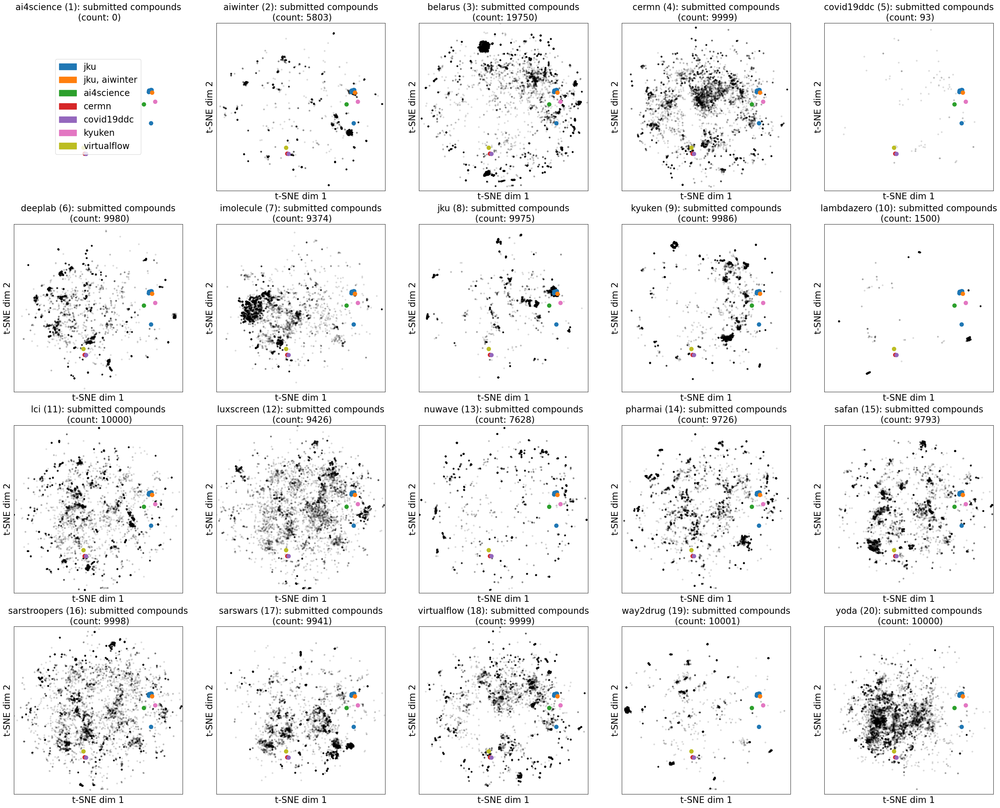

In [20]:
plt.figure(figsize=(40,40))

plot_counter = 1
for loop_counter, team in enumerate(team_loop):
    plt.subplot(5, 5, plot_counter)
    plot_counter += 1

    team_idx = df_subm_nsp5[df_subm_nsp5.team == team].tsne_idx.values
    team_tsne = subm_tsne[team_idx, :]
    if team in counts_nsp5.index:
        team_count = counts_nsp5.loc[team][0]
    else:
        team_count=0

    plt.title(f'{team} ({loop_counter + 1}): submitted compounds\n (count: {team_count})', fontsize=20)
    #plt.scatter(subm_tsne[:,0], subm_tsne[:,1], marker='.' , alpha=0.01, c='grey', rasterized=True)
    plt.scatter(team_tsne[:,0], team_tsne[:,1],marker='.', alpha=0.1 , c='black', rasterized=True)
    plt.scatter(hits_tsne[:,0] , hits_tsne[:,1] , c=[colors[t] for t in hits_team],  s=80, rasterized=True)
    plt.scatter(jkuAiwinter_tsne[:, 0], jkuAiwinter_tsne[:, 1], c='tab:orange', s=80, rasterized=True)
    plt.scatter(covid_19ddc_tsne[:, 0]+0.5, covid_19ddc_tsne[:, 1], c='tab:purple', s=80, rasterized=True)
    plt.xlim(-35.5,35.5)
    plt.ylim(-35.5,35.5)

    plt.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    labelleft=False,
    labelbottom=False)
    plt.xlabel('t-SNE dim 1', fontsize=20)
    plt.ylabel('t-SNE dim 2', fontsize=20)

plt.subplot(5, 5, 1)
colors_subm = {'team submission': 'black', 'others':'grey'}

handles = list()
for l, c in zip(colors.keys(), colors.values()):
    if c in [colors[t] for t in hits_team]:
        patch = mpatches.Patch(color=c, label=l)
        handles.append(patch)

plt.legend(handles=handles, loc='center', fontsize=20)
plt.axis('off')

plt.savefig('figures/figure_s9a.png', dpi=300)
plt.savefig('figures/figure_s9a.svg', dpi=300)

plt.show()

# Figure S9b: Nsp5 scatterplots - version 2

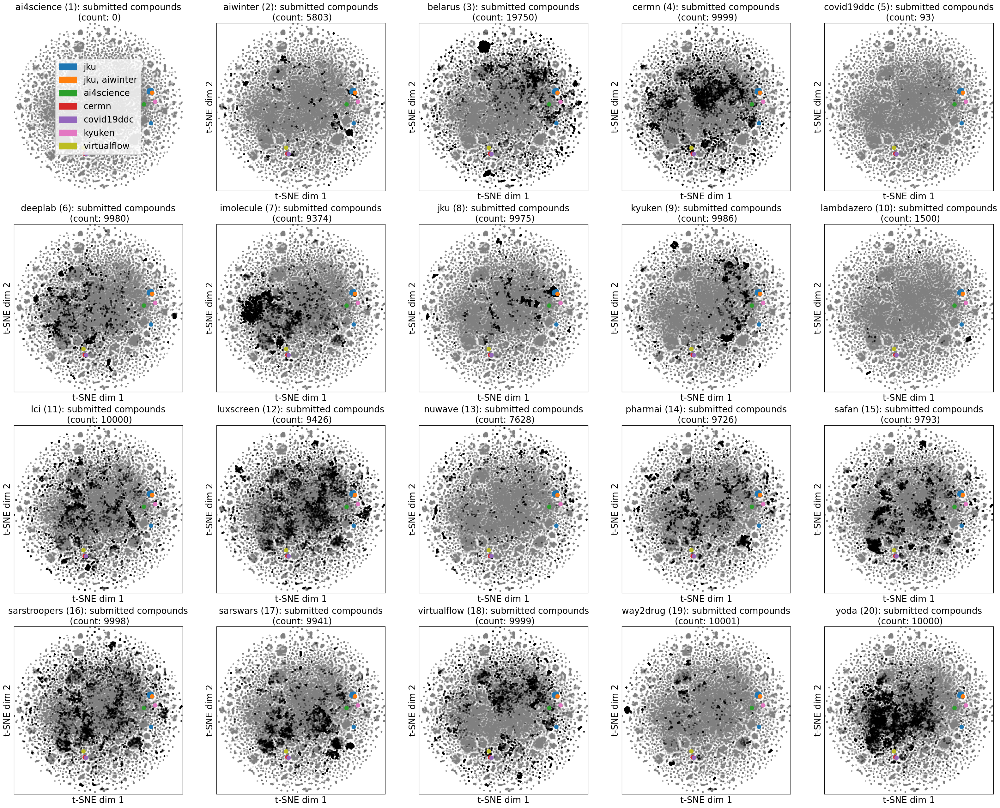

In [21]:
plt.figure(figsize=(40,40))

plot_counter = 1
for loop_counter, team in enumerate(team_loop):
    plt.subplot(5, 5, plot_counter)
    plot_counter += 1

    team_idx = df_subm_nsp5[df_subm_nsp5.team == team].tsne_idx.values
    team_tsne = subm_tsne[team_idx, :]
    if team in counts_nsp5.index:
        team_count = counts_nsp5.loc[team][0]
    else:
        team_count=0

    plt.title(f'{team} ({loop_counter + 1}): submitted compounds\n (count: {team_count})', fontsize=20)
    plt.scatter(subm_tsne[:,0], subm_tsne[:,1], marker='.' , alpha=0.01, c='grey', rasterized=True)
    plt.scatter(team_tsne[:,0], team_tsne[:,1],marker='.', alpha=0.3 , c='black', rasterized=True)
    plt.scatter(hits_tsne[:,0] , hits_tsne[:,1] , c=[colors[t] for t in hits_team],  s=80, rasterized=True)
    plt.scatter(jkuAiwinter_tsne[:, 0], jkuAiwinter_tsne[:, 1], c='tab:orange', s=80, rasterized=True)
    plt.scatter(covid_19ddc_tsne[:, 0]+0.5, covid_19ddc_tsne[:, 1], c='tab:purple', s=80, rasterized=True)
    plt.xlim(-35.5,35.5)
    plt.ylim(-35.5,35.5)

    plt.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    labelleft=False,
    labelbottom=False)
    plt.xlabel('t-SNE dim 1', fontsize=20)
    plt.ylabel('t-SNE dim 2', fontsize=20)

plt.subplot(5, 5, 1)
colors_subm = {'team submission': 'black', 'others':'grey'}

handles = list()
for l, c in zip(colors.keys(), colors.values()):
    if c in [colors[t] for t in hits_team]:
        patch = mpatches.Patch(color=c, label=l)
        handles.append(patch)

plt.legend(handles=handles, loc='center', fontsize=20)
plt.axis('off')

plt.savefig('figures/figure_s9b.png', dpi=300)
plt.savefig('figures/figure_s9b.svg', dpi=300)

plt.show()

# Figure 10: Prior-art plot

In [22]:
# Get pre-computed prior art tsne-embeddings
prior_art_tsne = ecfps_all_tsne[-(1243+27):-27, :]
hits_tsne =  ecfps_all_tsne[-27:, :]

In [23]:
# Load hit table
hits = pd.read_csv("data/hits.csv")
hits = hits.replace('Nsp3 macrodomain', 'Nsp3')

hits_team = hits.Team.values.flatten()
hits_targets = hits['Exp Target'].values.flatten()

In [24]:
# Pior art data
prior_art_df = pd.read_csv('data/prior_art_data.csv')

prior_art_targets = prior_art_df.target.values.flatten()

prior_art_df.head()

,SMILES,target
0,C1=CC(=C(C=C1Cl)CC2=C(C=CC(=C2)Cl)O)O,nsp5
1,COC1=CC=CC=C1N2CCN(CC2)CC(COC3=CC=CC4=CC=CC=C43)O,nsp5
2,CC1=CC=CC=C1S(=O)(=O)NC(=O)C2=CC(=C(C=C2)CC3=C...,nsp5
3,CCCCCC1=C(C(=CC2=C1OC3=CC(=CC(=C3C(=O)O2)C(=O)...,nsp5
4,CCCC(=O)OC1=CC2=C(C=C1)C(=CC(=O)O2)C,nsp5


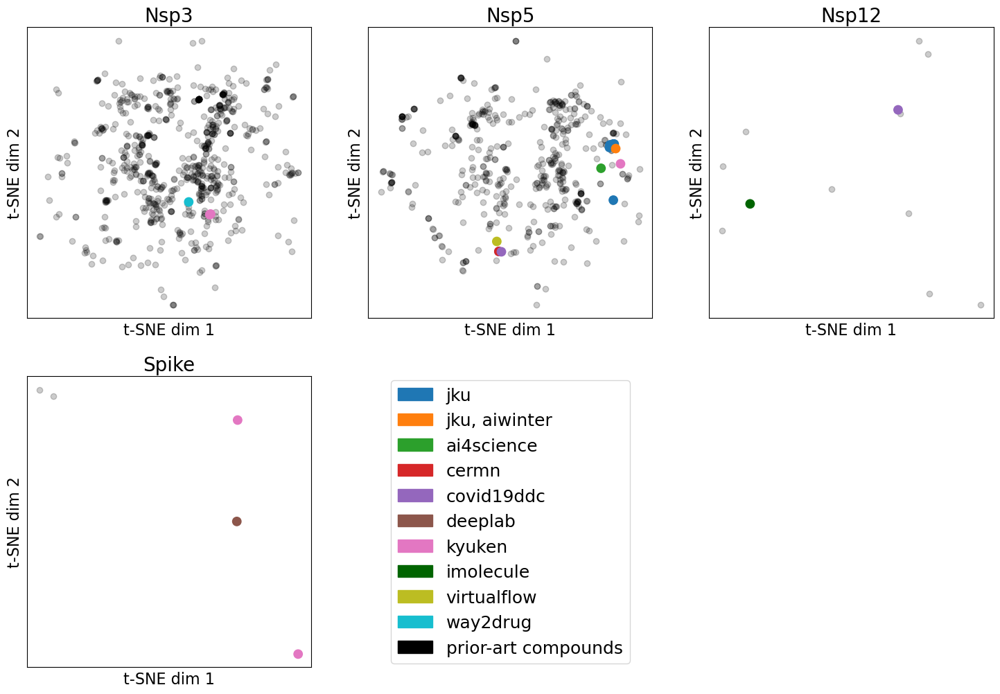

In [25]:
plt.figure(figsize=(18,12))

plt.subplot(2,3,1)
plt.title('Nsp3', fontsize=20)
target_prior_art = 'nsp3'
target_hit = 'Nsp3'

plt.scatter(x=prior_art_tsne[np.array(prior_art_targets) == target_prior_art ][:, 0],
            y=prior_art_tsne[np.array(prior_art_targets) == target_prior_art ][:, 1],
                   c='black', alpha=0.2)

plt.scatter(hits_tsne[np.array(hits_targets) == target_hit][:,0],
            hits_tsne[np.array(hits_targets) == target_hit][:,1],
            c=[colors[t] for t in np.array(hits_team)[np.array(hits_targets) == target_hit]],s=80)

plt.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    labelleft=False,
    labelbottom=False)
plt.xlabel('t-SNE dim 1', fontsize=16)
plt.ylabel('t-SNE dim 2', fontsize=16)

plt.subplot(2,3,2)
plt.title('Nsp5', fontsize=20)
target_prior_art = 'nsp5'
target_hit = 'Nsp5'

plt.scatter(x=prior_art_tsne[np.array(prior_art_targets) == target_prior_art ][:, 0],
            y=prior_art_tsne[np.array(prior_art_targets) == target_prior_art ][:, 1],
                   c='black', alpha=0.2)

plt.scatter(hits_tsne[np.array(hits_targets) == target_hit][:,0],
            hits_tsne[np.array(hits_targets) == target_hit][:,1],
            c=[colors[t] for t in np.array(hits_team)[np.array(hits_targets) == target_hit]],s=80)
plt.scatter(hits_tsne[(np.array(hits_targets) == target_hit) & (np.array(hits_team)=='jku, aiwinter')][:,0],
            hits_tsne[(np.array(hits_targets) == target_hit) & (np.array(hits_team)=='jku, aiwinter')][:,1],
            c='tab:orange',s=80)
plt.scatter(covid_19ddc_tsne[:,0]+0.5, covid_19ddc_tsne[:,1], c='tab:purple', s=80)

plt.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    labelleft=False,
    labelbottom=False)


plt.xlabel('t-SNE dim 1', fontsize=16)
plt.ylabel('t-SNE dim 2', fontsize=16)

plt.subplot(2,3,3)
plt.title('Nsp12', fontsize=20)
target_prior_art = 'nsp12'
target_hit = 'Nsp12'

plt.scatter(x=prior_art_tsne[np.array(prior_art_targets) == target_prior_art ][:, 0],
            y=prior_art_tsne[np.array(prior_art_targets) == target_prior_art ][:, 1],
                   c='black', alpha=0.2)

plt.scatter(hits_tsne[np.array(hits_targets) == target_hit][:,0],
            hits_tsne[np.array(hits_targets) == target_hit][:,1],
            c=[colors[t] for t in np.array(hits_team)[np.array(hits_targets) == target_hit]],s=80)

plt.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    labelleft=False,
    labelbottom=False)
plt.xlabel('t-SNE dim 1', fontsize=16)
plt.ylabel('t-SNE dim 2', fontsize=16)

plt.subplot(2,3,4)
plt.title('Spike', fontsize=20)
target_prior_art = 's'
target_hit = 'S'

plt.scatter(x=prior_art_tsne[np.array(prior_art_targets) == target_prior_art ][:, 0],
            y=prior_art_tsne[np.array(prior_art_targets) == target_prior_art ][:, 1],
                   c='black', alpha=0.2)

plt.scatter(hits_tsne[np.array(hits_targets) == target_hit][:,0],
            hits_tsne[np.array(hits_targets) == target_hit][:,1],
            c=[colors[t] for t in np.array(hits_team)[np.array(hits_targets) == target_hit]],s=80)
plt.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    labelleft=False,
    labelbottom=False)
plt.xlabel('t-SNE dim 1', fontsize=16)
plt.ylabel('t-SNE dim 2', fontsize=16)

plt.subplot(2,3,5)
handles = list()
for l, c in zip(colors.keys(), colors.values()):
    if c in [colors[t] for t in hits_team]:
        patch = mpatches.Patch(color=c, label=l)
        handles.append(patch)
    
        
# prior_art data
patch = mpatches.Patch(color='black', label='prior-art compounds')
handles.append(patch)

plt.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    labelleft=False,
    labelbottom=False)

plt.legend(handles=handles, loc='center', fontsize=18)
plt.axis('off')

plt.savefig('figures/figure_s10.png')
plt.savefig('figures/figure_s10.svg')

plt.show()